In [4]:
import os
os.chdir('D:\Birkbeck\MSc Data Science\Project\Data sets\Selected datasets')
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_regression, f_regression
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)
pd.set_option('precision',3)

# disable chained assignments
pd.options.mode.chained_assignment = None 

In [5]:
la_data = pd.read_csv('la_file.csv')
la_data = la_data.drop(columns = 'Unnamed: 0')
la_data.head()

,la_code,la_name,year,g_belt_area,total_area,rpi,int_rate_max,int_rate_min,median_income,all_new_sls_price,det_new_sls_price,semi_new_sls_price,terr_new_sls_price,flat_new_sls_price,all_exist_sls_price,det_exist_sls_price,semi_exist_sls_price,terr_exist_sls_price,flat_exist_sls_price,all_sls_price,det_sls_price,semi_sls_price,terr_sls_price,flat_sls_price,all_new_sls_num,det_new_sls_num,semi_new_sls_num,terr_new_sls_num,flat_new_sls_num,all_exist_sls_num,det_exist_sls_num,semi_exist_sls_num,terr_exist_sls_num,flat_exist_sls_num,all_sls_num,det_sls_num,semi_sls_num,terr_sls_num,flat_sls_num,population,num_hh_1dp,num_hh_>2dp,num_hh_2dp,num_hh_1f,num_hh_1m,num_hh_oth,num_hh_tot,gdp,dwell_stock,net_additions,num_wait_lst,aff_own,aff_rent,aff_int_rent,aff_lon_rent,aff_sh_own,aff_soc_rent,aff_unkwn
0,E07000032,Amber Valley,2002,8650,26540,176.2,4.0,4.0,17296,97175,113950,69080,69225,129950,66000,112750,60000,45000,60975,68950,113250,62000,45000,63500,278,191,56,26,5,2808,872,973,937,26,3086,1063,1029,963,31,117265,6044.944,2104.623,5841.286,7754.356,5929.351,21564.062,49238.622,1873,5884.0,383,2104.0,1.0,0.0,0.0,0.0,0.0,87.0,0.0
1,E07000224,Arun,2002,0,22100,176.2,4.0,4.0,16946,195000,227975,179998,139450,129000,124950,193000,130000,107000,72000,129950,199950,133000,109000,73075,504,256,82,59,107,4546,1310,1015,1164,1057,5050,1566,1097,1223,1164,142385,6050.397,2542.082,5940.958,13550.394,7260.726,27748.044,63092.600,1706,3614.0,528,933.0,6.0,0.0,0.0,0.0,0.0,18.0,0.0
2,E07000105,Ashford,2002,0,58060,176.2,4.0,4.0,20758,142500,185000,131500,117500,81995,118000,189000,115000,87500,62500,125995,186500,117000,92000,67500,671,342,112,183,34,2535,845,771,774,145,3206,1187,883,957,179,104377,5160.477,2350.363,5369.470,6380.554,4143.856,18356.017,41760.737,1928,5847.0,826,1438.0,25.0,0.0,0.0,0.0,0.0,26.0,0.0
3,E09000002,Barking and Dagenham,2002,530,3610,176.2,4.0,4.0,24813,128000,157000,126500,129995,124725,106000,169000,124995,111998,76000,107000,159750,124995,112193,78000,141,6,16,71,48,3247,27,355,2178,687,3388,33,371,2249,735,166357,9827.830,4595.733,8533.267,11910.702,8620.978,23893.375,67381.885,2628,22490.0,228,2668.0,51.0,0.0,0.0,0.0,0.0,279.0,0.0
4,E09000003,Barnet,2002,2380,8680,176.2,4.0,4.0,23112,219995,574950,397975,247750,191950,195000,447498,265500,205000,145500,196000,450000,268000,207500,150000,469,32,32,26,379,6761,574,1890,1351,2946,7230,606,1922,1377,3325,320552,16585.610,7606.986,15724.712,22774.323,16648.504,48598.091,127938.226,5866,12037.0,286,7030.0,81.0,0.0,0.0,0.0,0.0,145.0,0.0


In [6]:
# all_sls_price is the median house price for the area. This is the target. Move out to the end column
la_data.insert(len(la_data.columns)-1,'all_sls_price',la_data.pop('all_sls_price'))
la_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4291 entries, 0 to 4290
Data columns (total 58 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   la_code               4291 non-null   object 
 1   la_name               4291 non-null   object 
 2   year                  4291 non-null   int64  
 3   g_belt_area           4291 non-null   int64  
 4   total_area            4291 non-null   int64  
 5   rpi                   4291 non-null   float64
 6   int_rate_max          4291 non-null   float64
 7   int_rate_min          4291 non-null   float64
 8   median_income         4291 non-null   int64  
 9   all_new_sls_price     4291 non-null   int64  
 10  det_new_sls_price     4291 non-null   int64  
 11  semi_new_sls_price    4291 non-null   int64  
 12  terr_new_sls_price    4291 non-null   int64  
 13  flat_new_sls_price    4291 non-null   int64  
 14  all_exist_sls_price   4291 non-null   int64  
 15  det_exist_sls_price  

In [7]:
la_data.describe()

,year,g_belt_area,total_area,rpi,int_rate_max,int_rate_min,median_income,all_new_sls_price,det_new_sls_price,semi_new_sls_price,terr_new_sls_price,flat_new_sls_price,all_exist_sls_price,det_exist_sls_price,semi_exist_sls_price,terr_exist_sls_price,flat_exist_sls_price,det_sls_price,semi_sls_price,terr_sls_price,flat_sls_price,all_new_sls_num,det_new_sls_num,semi_new_sls_num,terr_new_sls_num,flat_new_sls_num,all_exist_sls_num,det_exist_sls_num,semi_exist_sls_num,terr_exist_sls_num,flat_exist_sls_num,all_sls_num,det_sls_num,semi_sls_num,terr_sls_num,flat_sls_num,population,num_hh_1dp,num_hh_>2dp,num_hh_2dp,num_hh_1f,num_hh_1m,num_hh_oth,num_hh_tot,gdp,dwell_stock,net_additions,num_wait_lst,aff_own,aff_rent,aff_int_rent,aff_lon_rent,aff_sh_own,aff_soc_rent,aff_unkwn,all_sls_price
count,4291.000,4291.000,4291.000,4291.000,4291.000,4291.000,4291.000,4291.000,4.291e+03,4.291e+03,4.291e+03,4291.000,4291.000,4.291e+03,4291.000,4291.000,4291.000,4.291e+03,4291.000,4291.000,4291.000,4291.000,4291.000,4291.000,4291.000,4291.000,4291.000,4291.000,4291.000,4291.000,4291.000,4291.000,4291.000,4291.000,4291.000,4291.000,4.291e+03,4291.000,4291.000,4291.000,4291.000,4291.000,4291.000,4291.000,4291.000,4291.000,4291.000,4284.000,4291.000,4291.000,4291.000,4291.000,4291.000,4291.000,4291.000,4291.000
mean,2011.026,5709.364,43132.515,233.703,2.144,1.831,24968.450,217573.775,3.308e+05,2.260e+05,2.144e+05,162201.849,187981.557,3.050e+05,192223.702,157351.885,122380.314,3.067e+05,194206.281,160439.846,129280.130,313.551,91.900,57.748,59.483,104.420,2630.865,615.587,814.216,839.386,361.677,2944.417,707.486,871.964,898.869,466.097,1.724e+05,9156.780,3396.667,7857.470,11699.650,10042.852,29351.465,71504.883,4279.055,5704.801,591.812,4521.350,34.773,35.580,3.668,0.140,12.573,58.983,0.011,191158.339
std,5.621,8518.708,54234.041,37.885,2.069,1.831,4291.199,83803.912,1.807e+05,1.124e+05,1.029e+05,72077.798,80956.474,1.436e+05,87528.540,76222.839,48324.699,1.420e+05,88094.470,77183.725,49291.664,269.153,98.323,55.051,51.237,170.129,1778.406,389.835,615.680,769.615,428.238,1973.492,447.957,642.519,795.490,540.943,1.205e+05,6611.808,3196.081,5088.491,8186.854,8295.145,18335.664,48744.649,3449.996,9383.194,499.800,6113.839,51.359,72.512,16.084,3.908,34.923,74.219,0.658,80739.501
min,2002.000,0.000,2140.000,176.200,0.250,0.100,14953.000,61450.000,8.707e+04,3.495e+04,3.800e+04,10000.000,33000.000,8.300e+04,48000.000,25000.000,19725.000,8.645e+04,49725.000,25000.000,32000.000,28.000,5.000,5.000,5.000,5.000,368.000,14.000,89.000,73.000,5.000,425.000,23.000,96.000,96.000,14.000,3.530e+04,1522.464,569.285,1607.366,2106.254,1407.102,6255.755,13726.766,608.000,0.000,-2285.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,36000.000
25%,2006.000,0.000,10320.000,198.100,0.500,0.500,21926.500,156997.500,2.287e+05,1.567e+05,1.490e+05,113247.500,130000.000,2.108e+05,130250.000,102425.000,89000.000,2.150e+05,132999.000,105200.000,95000.000,147.000,28.000,21.000,24.000,24.000,1559.000,364.000,452.000,398.000,111.000,1763.000,423.000,489.000,438.000,154.500,1.037e+05,5245.206,1777.924,4786.185,6989.562,5381.061,18663.411,43634.211,2221.500,0.000,292.500,1613.000,2.000,0.000,0.000,0.000,0.000,8.000,0.000,132850.000
50%,2011.000,1340.000,27900.000,235.200,0.750,0.500,24652.000,194995.000,2.850e+05,1.961e+05,1.850e+05,143995.000,171500.000,2.650e+05,170000.000,141000.000,114650.000,2.665e+05,170000.000,145000.000,120000.000,240.000,59.000,40.000,45.000,55.000,2147.000,540.000,641.000,599.000,245.000,2422.000,618.000,697.000,656.000,313.000,1.335e+05,6782.330,2435.074,6137.412,8956.194,7225.815,23537.034,55338.325,3318.000,3042.000,465.000,2699.000,19.000,0.000,0.000,0.000,0.000,37.000,0.000,174995.000
75%,2016.000,8140.000,58060.000,263.100,4.500,4.000,27543.000,254950.000,3.800e+05,2.650e+05,2.500e+05,194950.000,230000.000,3.600e+05,230000.000,191912.500,145000.000,3.600e+05,232250.000,195000.000,151849.000,390.000,120.000,75.000,79.000,122.000,3125.000,769.500,981.000,977.50

In [8]:
# feature aff_unknown only has 2 entries in the whole dataset - of 3 and 43. Noise, remove.
la_data = la_data.drop(la_data.iloc[:, 56:57], axis =1)
la_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4291 entries, 0 to 4290
Data columns (total 57 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   la_code               4291 non-null   object 
 1   la_name               4291 non-null   object 
 2   year                  4291 non-null   int64  
 3   g_belt_area           4291 non-null   int64  
 4   total_area            4291 non-null   int64  
 5   rpi                   4291 non-null   float64
 6   int_rate_max          4291 non-null   float64
 7   int_rate_min          4291 non-null   float64
 8   median_income         4291 non-null   int64  
 9   all_new_sls_price     4291 non-null   int64  
 10  det_new_sls_price     4291 non-null   int64  
 11  semi_new_sls_price    4291 non-null   int64  
 12  terr_new_sls_price    4291 non-null   int64  
 13  flat_new_sls_price    4291 non-null   int64  
 14  all_exist_sls_price   4291 non-null   int64  
 15  det_exist_sls_price  

In [9]:
#split into train & test:
X = la_data.iloc[ : , 0:56]
y = la_data.iloc[ : , -1]

X_train, X_test,y_train, y_test = train_test_split(X,y, test_size = 0.2, random_state = 3)
X_train.shape, y_train.shape, X_test.shape

((3432, 56), (3432,), (859, 56))

# Simple Graphs Exploring Key Features

### Prices over time

Would expect that prices change over time in a mostly linear fashion. 

In [10]:
y_train = pd.DataFrame(y_train)
la_train = X_train.merge(y_train, left_index = True, right_index = True)
la_train.head()

,la_code,la_name,year,g_belt_area,total_area,rpi,int_rate_max,int_rate_min,median_income,all_new_sls_price,det_new_sls_price,semi_new_sls_price,terr_new_sls_price,flat_new_sls_price,all_exist_sls_price,det_exist_sls_price,semi_exist_sls_price,terr_exist_sls_price,flat_exist_sls_price,det_sls_price,semi_sls_price,terr_sls_price,flat_sls_price,all_new_sls_num,det_new_sls_num,semi_new_sls_num,terr_new_sls_num,flat_new_sls_num,all_exist_sls_num,det_exist_sls_num,semi_exist_sls_num,terr_exist_sls_num,flat_exist_sls_num,all_sls_num,det_sls_num,semi_sls_num,terr_sls_num,flat_sls_num,population,num_hh_1dp,num_hh_>2dp,num_hh_2dp,num_hh_1f,num_hh_1m,num_hh_oth,num_hh_tot,gdp,dwell_stock,net_additions,num_wait_lst,aff_own,aff_rent,aff_int_rent,aff_lon_rent,aff_sh_own,aff_soc_rent,all_sls_price
1752,E06000018,Nottingham,2009,740,7460,213.7,1.50,0.50,25076,125000,215000,138475,135802,95000,98000,170000,103000,80000,95000,173500,105000,81000,95000,257,22,38,45,152,2143,397,699,786,261,2400,419,737,831,413,294808,15777.925,6907.998,11331.603,21127.188,24005.939,43907.394,123058.047,8025,28931.0,892,9398.0,121.0,0.0,0.0,0.0,0.0,41.0,100000
317,E06000010,"Kingston upon Hull, City of",2003,0,7160,181.3,3.75,3.50,18318,96995,110000,76995,94998,81995,45125,105000,67000,37500,50000,108000,68000,38000,57500,567,265,138,100,64,5893,328,1236,4017,312,6460,593,1374,4117,376,250604,14020.529,5697.884,11923.682,18593.997,17959.992,38955.778,107151.862,4439,32410.0,-42,9924.0,0.0,0.0,0.0,0.0,0.0,62.0,48500
3289,E07000123,Preston,2016,660,14230,263.1,0.25,0.25,26480,224995,278995,187995,121247,50950,123500,230000,146000,91875,72500,249998,149950,93000,66250,189,108,45,21,15,1673,294,556,624,199,1862,402,601,645,214,141023,7324.822,3020.818,5559.457,9509.461,11564.993,20740.921,57720.471,4829,0.0,484,2834.0,1.0,67.0,0.0,0.0,12.0,3.0,129750
4036,E06000011,East Riding of Yorkshire,2020,0,240480,293.1,0.25,0.10,29407,270000,321035,199995,179975,195000,177500,265000,168000,130000,92500,280000,170000,132950,97000,849,554,213,68,14,4391,1498,1618,1034,241,5240,2052,1831,1102,255,343201,17116.771,4238.636,13718.724,23734.368,18527.004,72061.915,149397.418,8086,11298.0,1241,6556.0,12.0,203.0,2.0,0.0,100.0,20.0,190000
1439,E09000006,Bromley,2008,7660,15010,214.8,5.25,2.00,27236,259950,750000,350000,442500,227992,260000,502000,315000,250000,196000,515000,315000,250000,198625,165,19,11,5,130,4683,714,1152,1189,1628,4848,733,1163,1194,1758,304968,16388.332,5944.400,15663.127,23119.576,16843.843,49826.246,127785.524,7545,86.0,773,4861.0,169.0,0.0,6.0,0.0,0.0,175.0,260000


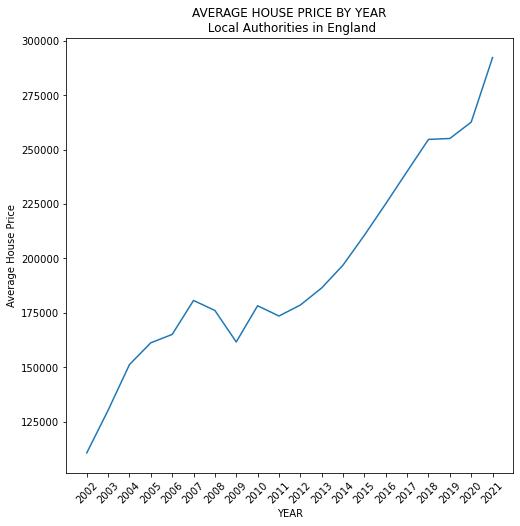

In [11]:
y = la_train.groupby('year').all_sls_price.mean()
x = range(2002,2022)

sls_yr =pd.DataFrame(y,x).reset_index()
sls_yr.columns = ['year','avg_price']

fig, ax = plt.subplots(figsize=(8, 8))
plt.plot(sls_yr['year'],sls_yr['avg_price'])
plt.xlabel('YEAR')
plt.ylabel('Average House Price')
plt.title('AVERAGE HOUSE PRICE BY YEAR\n Local Authorities in England')
ax.set_xticks(range(2002,2022))
ax.set_xticklabels(range(2002,2022),rotation = 45)
plt.show()

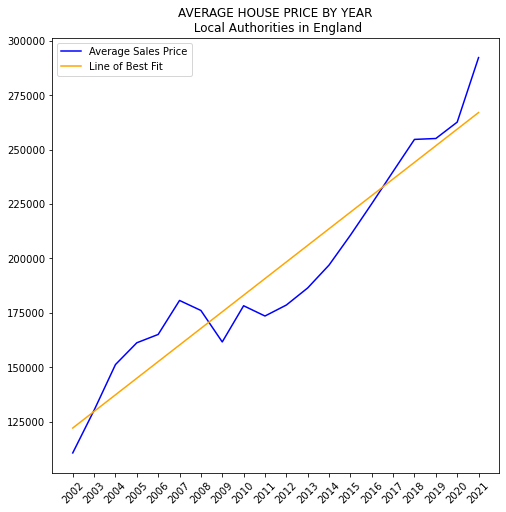

In [12]:
x = sls_yr.year.values
x = x.reshape(-1,1)
y = sls_yr.avg_price.values

line_fit = LinearRegression()
line_fit.fit(x,y)
sls_pred = line_fit.predict(x)


fig, ax = plt.subplots(figsize=(8, 8))
plt.plot(x,y,color = 'blue', label = 'Average Sales Price')
plt.plot(x,sls_pred, color = 'orange',label = 'Line of Best Fit')
plt.title('AVERAGE HOUSE PRICE BY YEAR\n Local Authorities in England')
ax.set_xticks(range(2002,2022))
ax.set_xticklabels(range(2002,2022),rotation = 45)
plt.legend()
plt.show()

In [13]:
line_fit.intercept_

-15150375.818152243

In [14]:
line_fit.coef_

array([7628.60021818])

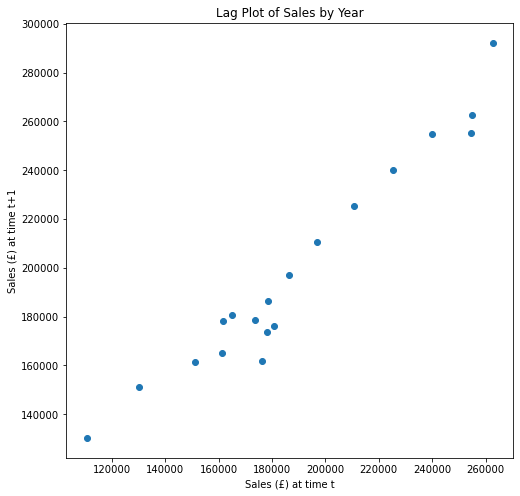

In [15]:
fig, ax = plt.subplots(figsize=(8, 8))

from pandas.plotting import lag_plot
lag_plot(sls_yr['avg_price'])
plt.title('Lag Plot of Sales by Year')
plt.xlabel('Sales (£) at time t')
plt.ylabel('Sales (£) at time t+1')
plt.show()

## Inflation

Review sales price and median income after adjusting for inflation (rpi feature)
To review what has happened over the time period

In [16]:
newdf = la_train[['year','all_sls_price','median_income','rpi']]
infl_data = newdf.groupby('year')[['all_sls_price','median_income','rpi']].mean().reset_index()
infl_data['sls_adj'] = infl_data['all_sls_price']/(infl_data['rpi']/100)
infl_data['income_adj'] = infl_data['median_income']/(infl_data['rpi']/100)
infl_data.head(21)

,year,all_sls_price,median_income,rpi,sls_adj,income_adj
0,2002,110641.116,20030.244,176.2,62792.915,11367.902
1,2003,130246.396,20782.319,181.3,71840.262,11462.945
2,2004,151231.601,21262.016,186.7,81002.464,11388.332
3,2005,161248.205,22126.490,192.0,83983.440,11524.214
4,2006,165076.123,22573.412,198.1,83329.694,11394.958
5,2007,180688.223,23437.048,206.6,87457.998,11344.166
6,2008,176091.383,24191.617,214.8,81979.229,11262.391
7,2009,161632.576,24652.977,213.7,75635.272,11536.255
8,2010,178255.248,24713.855,223.6,79720.594,11052.708
9,2011,173542.525,24903.791,235.2,73785.087,10588.347


In [17]:
#infl_data.info()

In [18]:
# x = infl_data['year']
# fig, ax = plt.subplots(figsize=(15, 10))
# plt.plot(x,infl_data['all_sls_price'], linewidth = 2 , color = 'blue',label = 'Median Sales Price')
# plt.plot(x,infl_data['sls_adj'], linewidth = 2 , color = 'blue', linestyle = 'dashed', label = 'Adjusted Sales Price')
# plt.plot(x,infl_data['median_income'], linewidth = 2 , color = 'green',label = 'Median Income')
# plt.plot(x,infl_data['income_adj'], linewidth = 2 , color = 'green', linestyle = 'dashed', label = 'Adjusted Income')
# ax.set_xticks(range(2002,2022))
# ax.set_xticklabels(range(2002,2022),rotation = 45)
# plt.legend()
# plt.title('Median House Prices and Income\n England 2002-2021')

In [19]:
#with rescaled data
infl_data_scaled = infl_data
infl_data_scaled
scaler = MinMaxScaler()
infl_data_scaled[['all_sls_price','median_income','sls_adj','income_adj']] = scaler.fit_transform(infl_data_scaled[['all_sls_price','median_income','sls_adj','income_adj']])
#infl_data_scaled

Text(0.5, 1.0, 'Scaled Median House Prices and Income\n England 2002-2021')

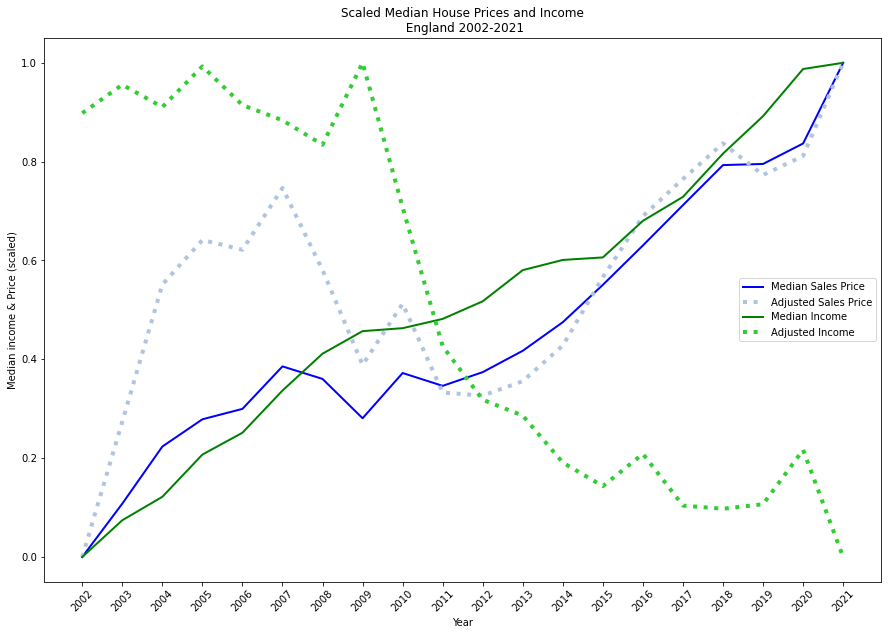

In [20]:
x = range(2002,2022)
fig, ax = plt.subplots(figsize=(15, 10))
plt.plot(x,infl_data_scaled['all_sls_price'], linewidth = 2 , color = 'blue',label = 'Median Sales Price')
plt.plot(x,infl_data_scaled['sls_adj'], linewidth = 4 , color = 'lightsteelblue', linestyle = ':', label = 'Adjusted Sales Price')
plt.plot(x,infl_data_scaled['median_income'], linewidth = 2 , color = 'green',label = 'Median Income')
plt.plot(x,infl_data_scaled['income_adj'], linewidth = 4 , color = 'limegreen', linestyle = ':', label = 'Adjusted Income')
ax.set_xticks(range(2002,2022))
ax.set_xticklabels(range(2002,2022),rotation = 45)
plt.xlabel('Year')
plt.ylabel('Median income & Price (scaled)')
plt.legend()
plt.title('Scaled Median House Prices and Income\n England 2002-2021')

## Net additions

Key feature to answer the question of whether building more houses improves affordability. 
Visualise the feature to gain understanding

In [21]:
net_add_data = la_train[['year','net_additions']]
#net_add_data.head()

[]

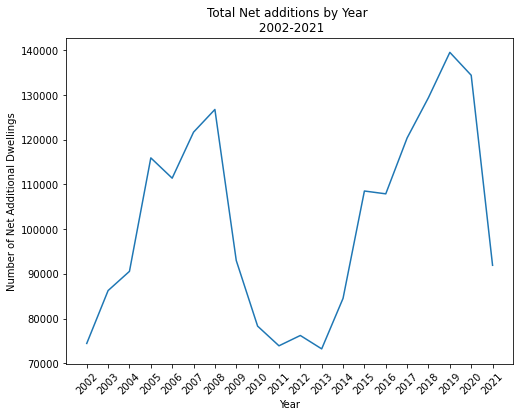

In [22]:
net_add_data = net_add_data.groupby('year')['net_additions'].sum().reset_index()
fig, ax = plt.subplots(figsize=(8, 6))
plt.plot(net_add_data['year'],net_add_data['net_additions'])
plt.title('Total Net additions by Year \n 2002-2021')
plt.xlabel('Year')
plt.ylabel('Number of Net Additional Dwellings')
ax.set_xticks(range(2002,2022))
ax.set_xticklabels(range(2002,2022),rotation = 45)
plt.plot()

In [23]:
# Net additions and sales price, plus inflation adjusted prices from above. scaled data. 
adj_sls =infl_data[['year','sls_adj']]
net_add_sls = net_add_data.merge(sls_yr)
scaler = MinMaxScaler()
net_add_sls[['net_additions','avg_price']] = scaler.fit_transform(net_add_sls[['net_additions','avg_price']])
#net_add_sls.head()

[]

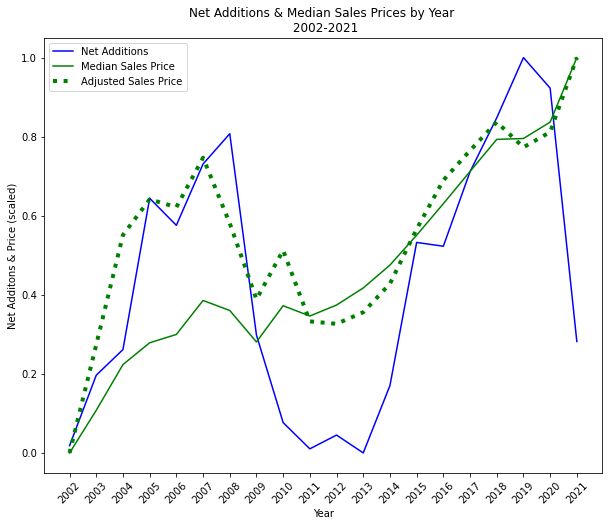

In [24]:
x = range(2002,2022)
fig, ax = plt.subplots(figsize=(10, 8))
plt.plot(x,net_add_sls['net_additions'], color = 'blue',label = 'Net Additions')
plt.plot(x,net_add_sls['avg_price'], color = 'green', label = 'Median Sales Price')
plt.plot(x,adj_sls['sls_adj'], color = 'green',linewidth = 4, linestyle = ':', label = 'Adjusted Sales Price')
plt.title('Net Additions & Median Sales Prices by Year \n 2002-2021')
plt.xlabel('Year')
plt.ylabel('Net Additons & Price (scaled)')
plt.legend()
ax.set_xticks(range(2002,2022))
ax.set_xticklabels(range(2002,2022),rotation = 45)
plt.plot()

## Dwelling Stock

This is the amount of stock of properties that a local authority has to provide homes for households seeking accomodation provided by the local authority. 

In [25]:
dwell_stk = la_train[['year', 'dwell_stock']]
dwell_stk.head()

,year,dwell_stock
1752,2009,28931.0
317,2003,32410.0
3289,2016,0.0
4036,2020,11298.0
1439,2008,86.0


[]

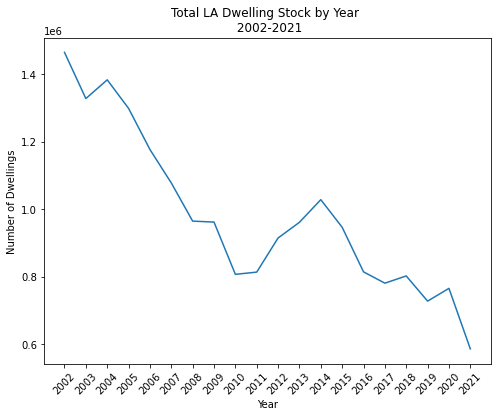

In [26]:
dwell_stk = dwell_stk.groupby('year')['dwell_stock'].sum().reset_index()
fig, ax = plt.subplots(figsize=(8, 6))
plt.plot(dwell_stk['year'],dwell_stk['dwell_stock'])
plt.title('Total LA Dwelling Stock by Year \n 2002-2021')
plt.xlabel('Year')
plt.ylabel('Number of Dwellings')
ax.set_xticks(range(2002,2022))
ax.set_xticklabels(range(2002,2022),rotation = 45)
plt.plot()

## Households on Housing Waiting List

[]

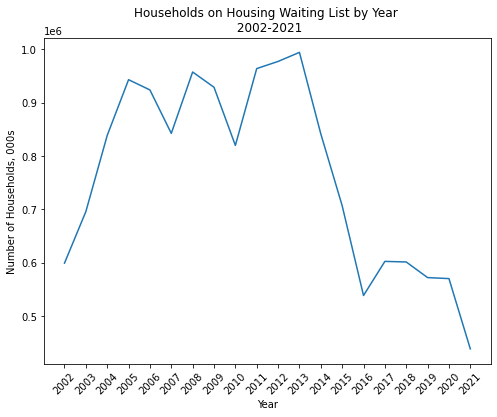

In [27]:
hh_wait = la_train[['year', 'num_wait_lst']]

hh_wait = hh_wait.groupby('year')['num_wait_lst'].sum().reset_index()
pd.set_option('precision',4)


fig, ax = plt.subplots(figsize=(8, 6))
plt.plot(hh_wait['year'],hh_wait['num_wait_lst'])
plt.title('Households on Housing Waiting List by Year \n 2002-2021')
plt.xlabel('Year')
plt.ylabel('Number of Households, 000s')
ax.set_xticks(range(2002,2022))
ax.set_xticklabels(range(2002,2022),rotation = 45)
plt.plot()


## Affordable completions

As a proportion of net additions by year

In [28]:
aff_comp = la_train[['year','aff_own','aff_rent','aff_int_rent','aff_lon_rent','aff_sh_own','aff_soc_rent','net_additions']]
aff_comp['all_aff'] = aff_comp.iloc[:,1:7].sum(axis = 1)
aff_comp['all_other'] = aff_comp['net_additions']-aff_comp['all_aff']
aff_comp = aff_comp.groupby('year')[['all_other','all_aff']].sum()
aff_comp['all_pc'] = aff_comp['all_other']/(aff_comp['all_other']+aff_comp['all_aff'])
aff_comp['aff_pc'] = aff_comp['all_aff']/(aff_comp['all_other']+aff_comp['all_aff'])
aff_comp

,all_other,all_aff,all_pc,aff_pc
year,,,,
2002,57168.0,17256.0,0.7681,0.2319
2003,68384.0,17868.0,0.7928,0.2072
2004,72043.0,18506.0,0.7956,0.2044
2005,94641.0,21288.0,0.8164,0.1836
2006,88344.0,23046.0,0.7931,0.2069
2007,100773.0,20904.0,0.8282,0.1718
2008,101855.0,24900.0,0.8036,0.1964
2009,66388.0,26592.0,0.7140,0.2860
2010,49922.0,28376.0,0.6376,0.3624


[]

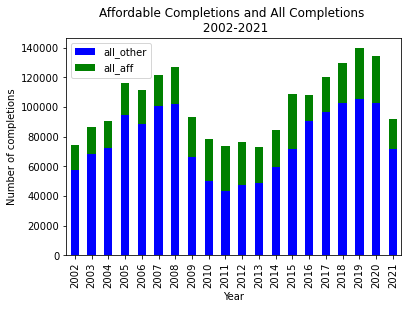

In [29]:
aff_comp[['all_other','all_aff']].plot.bar(stacked = True, color = {'all_other': 'blue','all_aff':'green' })
plt.title('Affordable Completions and All Completions \n 2002-2021')
plt.xlabel('Year')
plt.ylabel('Number of completions')
plt.plot()


[]

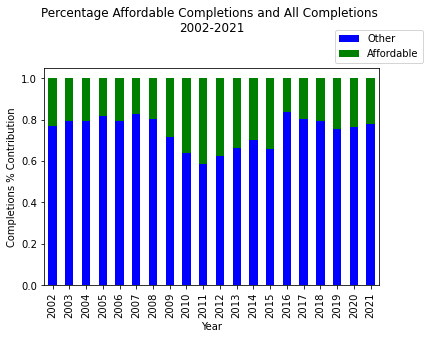

In [30]:
aff_comp[['all_pc','aff_pc']].plot.bar(stacked = True,color = {'all_pc': 'blue','aff_pc':'green' })
plt.title('Percentage Affordable Completions and All Completions \n2002-2021\n\n')
plt.xlabel('Year')
plt.ylabel('Completions % Contribution')
plt.legend(['Other', 'Affordable'],loc='lower center', bbox_to_anchor=(1,1))
plt.plot()

### Correlations

In [31]:
correl = la_train.corr(method='pearson')
# to target - 'all_sls_price'
print(correl['all_sls_price'].sort_values())

int_rate_max           -0.3358
int_rate_min           -0.3356
terr_sls_num           -0.3011
terr_exist_sls_num     -0.2995
semi_exist_sls_num     -0.2792
semi_sls_num           -0.2734
dwell_stock            -0.2576
num_wait_lst           -0.2391
num_hh_1m              -0.1958
all_exist_sls_num      -0.1890
all_sls_num            -0.1868
num_hh_1f              -0.1831
terr_new_sls_num       -0.1798
num_hh_1dp             -0.1678
num_hh_>2dp            -0.1666
num_hh_tot             -0.1631
aff_soc_rent           -0.1579
population             -0.1471
num_hh_oth             -0.1425
all_new_sls_num        -0.1218
num_hh_2dp             -0.1136
det_new_sls_num        -0.1074
aff_own                -0.0918
semi_new_sls_num       -0.0735
flat_new_sls_num       -0.0503
det_sls_num            -0.0134
aff_int_rent            0.0043
det_exist_sls_num       0.0119
total_area              0.0292
net_additions           0.0384
gdp                     0.0939
flat_sls_num            0.0992
g_belt_a

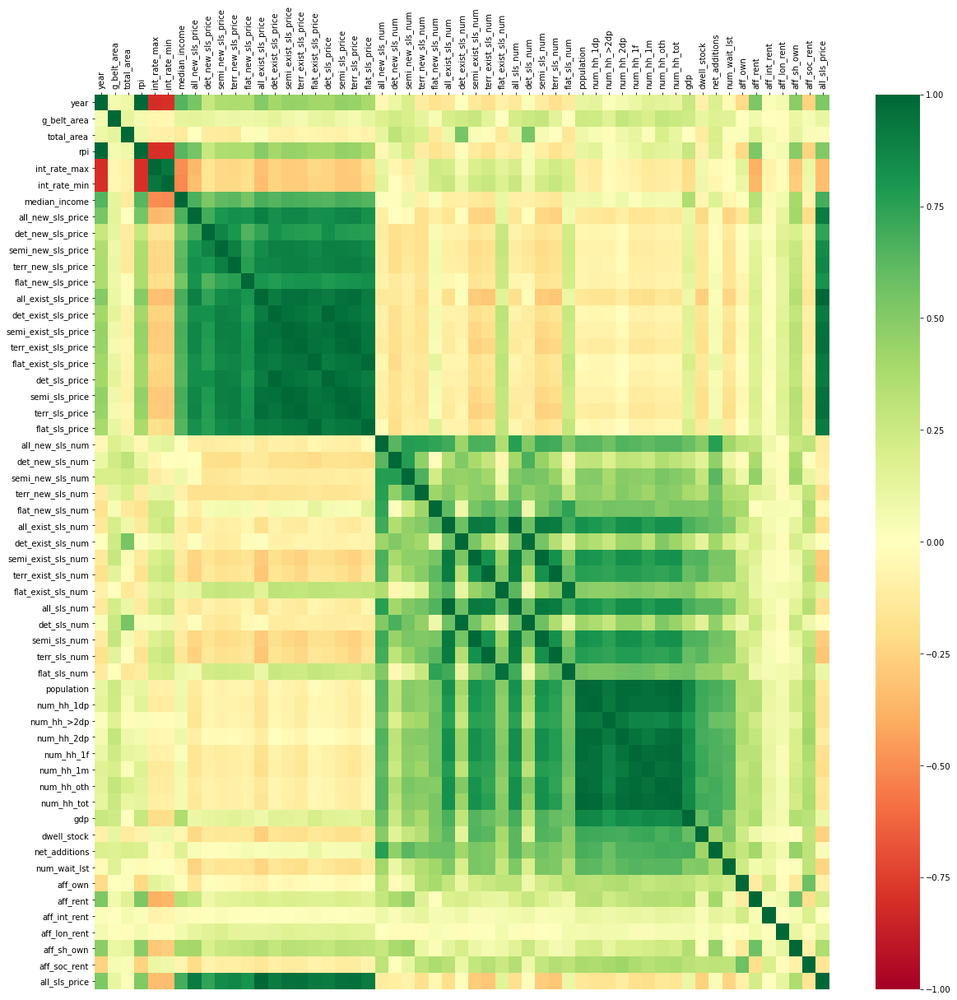

In [32]:
# correlation between features, easiest to see in a heat map:
la_train_exl_area = la_train.drop(columns = ['la_name', 'la_code'])
col_labels = la_train_exl_area.columns.to_list()

correl2 = la_train_exl_area.corr(method='pearson')

fig, ax = plt.subplots(figsize=(20, 20))
sns.heatmap(correl2,cmap = 'RdYlGn',vmax =1,vmin = -1,center = 0)
ax.xaxis.tick_top() # x axis on top
ax.xaxis.set_label_position('top')
ax.set_xticklabels(col_labels,rotation = 90)
plt.show()

## Feature Combinations

In [33]:
#Population density
la_train['pop_density'] = la_train.population/la_train.total_area

#Available land - assumption that green belt isn't readily avaiable land
la_train['avail_land'] = (la_train.total_area-la_train.g_belt_area)/la_train.total_area

#Percentage green belt - very similar to avaialble land. check if one is better.
la_train['g_belt_percent'] = la_train.g_belt_area/la_train.total_area

#Population denisty on avaiable land - what is the density on the land that is not green belt
la_train['pop_density_avail'] = la_train.population/(la_train.total_area-la_train.g_belt_area)

#Ratio of new to existing prices
#this would be easier to forecast if didn't have new/existing prices yet but did have historic info
la_train['ratio_new_exist_prices'] = la_train.all_new_sls_price/la_train.all_exist_sls_price

#Ratio of new to existing sales volume
la_train['ratio_new_existing_num'] = la_train.all_new_sls_num/la_train.all_exist_sls_num

#Number on housing waiting list to total number of total households
la_train['wait_list_to_hh'] = la_train.num_wait_lst/la_train.num_hh_tot

#Number of net additions to the number of households
la_train['net_add_to_hh'] = la_train.net_additions/la_train.num_hh_tot

#GDP to household - hh and population strongly correlated.
# HH a concentration of the population
la_train['gdp_hh'] = la_train.gdp/la_train.num_hh_tot

#Avg hh size - larger hh, more people, different demand for housing size.
la_train['avg_hh_size'] = la_train.population/la_train.num_hh_tot

# proportion of each type of property sold
la_train['prop_det_sls'] = la_train.det_sls_num/la_train.all_sls_num
la_train['prop_semi_sls'] = la_train.semi_sls_num/la_train.all_sls_num
la_train['prop_terr_sls'] = la_train.terr_sls_num/la_train.all_sls_num
la_train['prop_flat_sls'] = la_train.flat_sls_num/la_train.all_sls_num

#proportion of one person households
la_train['prop_hh_1_person'] = (la_train.num_hh_1f+la_train.num_hh_1m)/la_train.num_hh_tot

#proportion of households with dependents
la_train['prop_hh_dp'] = (la_train['num_hh_1dp'] + la_train['num_hh_2dp'] + la_train['num_hh_>2dp'])/la_train['num_hh_tot']


In [34]:
# move target variable to last column
la_train.insert(len(la_train.columns)-1,'all_sls_price',la_train.pop('all_sls_price'))

#Possible to have divided by zero in some instances. So dropna just in case
la_train.dropna(inplace =True)
la_train.head()

,la_code,la_name,year,g_belt_area,total_area,rpi,int_rate_max,int_rate_min,median_income,all_new_sls_price,det_new_sls_price,semi_new_sls_price,terr_new_sls_price,flat_new_sls_price,all_exist_sls_price,det_exist_sls_price,semi_exist_sls_price,terr_exist_sls_price,flat_exist_sls_price,det_sls_price,semi_sls_price,terr_sls_price,flat_sls_price,all_new_sls_num,det_new_sls_num,semi_new_sls_num,terr_new_sls_num,flat_new_sls_num,all_exist_sls_num,det_exist_sls_num,semi_exist_sls_num,terr_exist_sls_num,flat_exist_sls_num,all_sls_num,det_sls_num,semi_sls_num,terr_sls_num,flat_sls_num,population,num_hh_1dp,num_hh_>2dp,num_hh_2dp,num_hh_1f,num_hh_1m,num_hh_oth,num_hh_tot,gdp,dwell_stock,net_additions,num_wait_lst,aff_own,aff_rent,aff_int_rent,aff_lon_rent,aff_sh_own,aff_soc_rent,pop_density,avail_land,g_belt_percent,pop_density_avail,ratio_new_exist_prices,ratio_new_existing_num,wait_list_to_hh,net_add_to_hh,gdp_hh,avg_hh_size,prop_det_sls,prop_semi_sls,prop_terr_sls,prop_flat_sls,prop_hh_1_person,prop_hh_dp,all_sls_price
1752,E06000018,Nottingham,2009,740,7460,213.7,1.50,0.50,25076,125000,215000,138475,135802,95000,98000,170000,103000,80000,95000,173500,105000,81000,95000,257,22,38,45,152,2143,397,699,786,261,2400,419,737,831,413,294808,15777.9247,6907.9983,11331.6035,21127.1880,24005.9391,43907.3936,123058.0472,8025,28931.0,892,9398.0,121.0,0.0,0.0,0.0,0.0,41.0,39.5185,0.9008,0.0992,43.8702,1.2755,0.1199,0.0764,0.0072,0.0652,2.3957,0.1746,0.3071,0.3463,0.1721,0.3668,0.2764,100000
317,E06000010,"Kingston upon Hull, City of",2003,0,7160,181.3,3.75,3.50,18318,96995,110000,76995,94998,81995,45125,105000,67000,37500,50000,108000,68000,38000,57500,567,265,138,100,64,5893,328,1236,4017,312,6460,593,1374,4117,376,250604,14020.5292,5697.8838,11923.6818,18593.9973,17959.9924,38955.7778,107151.8622,4439,32410.0,-42,9924.0,0.0,0.0,0.0,0.0,0.0,62.0,35.0006,1.0000,0.0000,35.0006,2.1495,0.0962,0.0926,-0.0004,0.0414,2.3388,0.0918,0.2127,0.6373,0.0582,0.3411,0.2953,48500
3289,E07000123,Preston,2016,660,14230,263.1,0.25,0.25,26480,224995,278995,187995,121247,50950,123500,230000,146000,91875,72500,249998,149950,93000,66250,189,108,45,21,15,1673,294,556,624,199,1862,402,601,645,214,141023,7324.8216,3020.8178,5559.4569,9509.4611,11564.9930,20740.9207,57720.4712,4829,0.0,484,2834.0,1.0,67.0,0.0,0.0,12.0,3.0,9.9103,0.9536,0.0464,10.3923,1.8218,0.1130,0.0491,0.0084,0.0837,2.4432,0.2159,0.3228,0.3464,0.1149,0.3651,0.2756,129750
4036,E06000011,East Riding of Yorkshire,2020,0,240480,293.1,0.25,0.10,29407,270000,321035,199995,179975,195000,177500,265000,168000,130000,92500,280000,170000,132950,97000,849,554,213,68,14,4391,1498,1618,1034,241,5240,2052,1831,1102,255,343201,17116.7713,4238.6364,13718.7240,23734.3675,18527.0036,72061.9153,149397.4180,8086,11298.0,1241,6556.0,12.0,203.0,2.0,0.0,100.0,20.0,1.4271,1.0000,0.0000,1.4271,1.5211,0.1934,0.0439,0.0083,0.0541,2.2972,0.3916,0.3494,0.2103,0.0487,0.2829,0.2348,190000
1439,E09000006,Bromley,2008,7660,15010,214.8,5.25,2.00,27236,259950,750000,350000,442500,227992,260000,502000,315000,250000,196000,515000,315000,250000,198625,165,19,11,5,130,4683,714,1152,1189,1628,4848,733,1163,1194,1758,304968,16388.3322,5944.4002,15663.1270,23119.5758,16843.8434,49826.2457,127785.5243,7545,86.0,773,4861.0,169.0,0.0,6.0,0.0,0.0,175.0,20.3177,0.4897,0.5103,41.4922,0.9998,0.0352,0.0380,0.0060,0.0590,2.3866,0.1512,0.2399,0.2463,0.3626,0.3127,0.2973,260000


In [35]:
la_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3425 entries, 1752 to 1688
Data columns (total 73 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   la_code                 3425 non-null   object 
 1   la_name                 3425 non-null   object 
 2   year                    3425 non-null   int64  
 3   g_belt_area             3425 non-null   int64  
 4   total_area              3425 non-null   int64  
 5   rpi                     3425 non-null   float64
 6   int_rate_max            3425 non-null   float64
 7   int_rate_min            3425 non-null   float64
 8   median_income           3425 non-null   int64  
 9   all_new_sls_price       3425 non-null   int64  
 10  det_new_sls_price       3425 non-null   int64  
 11  semi_new_sls_price      3425 non-null   int64  
 12  terr_new_sls_price      3425 non-null   int64  
 13  flat_new_sls_price      3425 non-null   int64  
 14  all_exist_sls_price     3425 non-null

In [36]:
la_train.to_csv('la_train_data.csv')

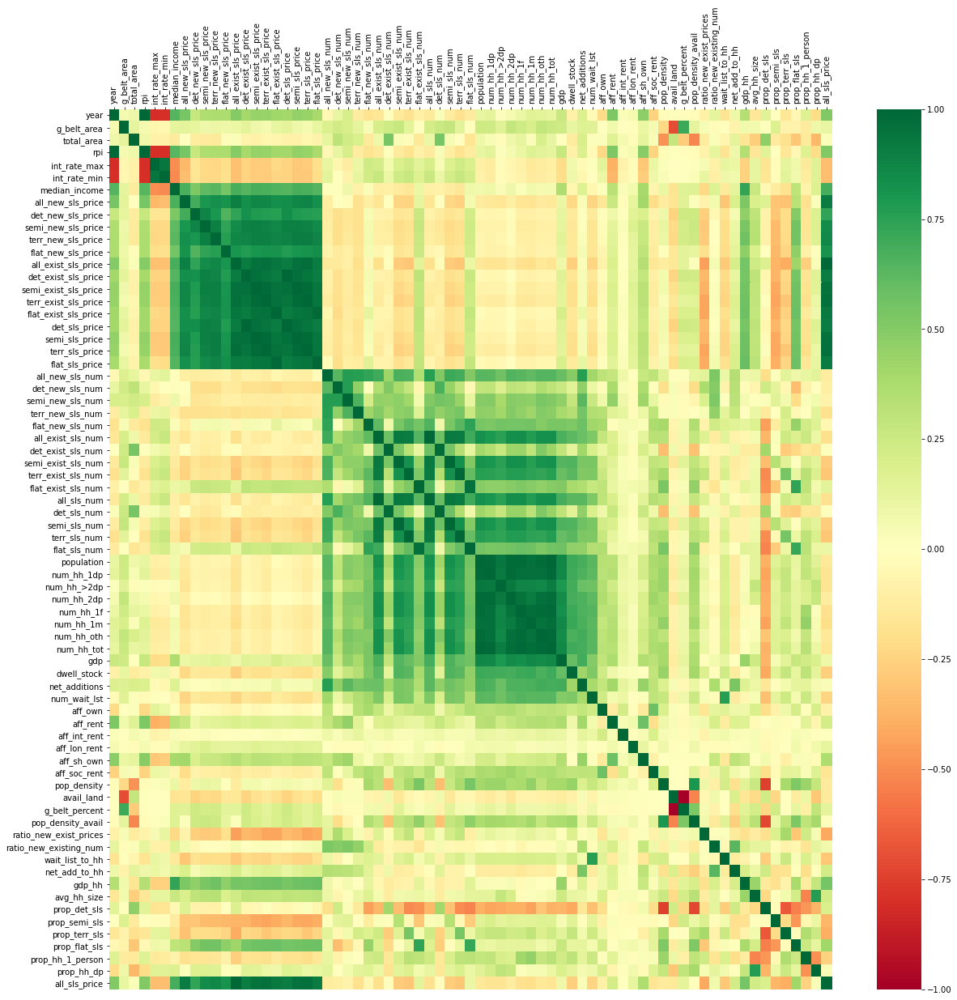

In [37]:
# run correlations again - will be big
la_train_exl_area = la_train.drop(columns = ['la_name', 'la_code'])
col_labels = la_train_exl_area.columns.to_list()

correl2 = la_train_exl_area.corr(method='pearson')

fig, ax = plt.subplots(figsize=(20, 20))
sns.heatmap(correl2,cmap = 'RdYlGn',vmax =1,vmin = -1,center = 0)
ax.xaxis.tick_top() # x axis on top
ax.xaxis.set_label_position('top')
ax.set_xticklabels(col_labels,rotation = 90)
plt.show()

In [38]:
print(correl2['all_sls_price'].sort_values())

ratio_new_exist_prices   -0.4125
prop_terr_sls            -0.3983
prop_semi_sls            -0.3653
int_rate_max             -0.3352
int_rate_min             -0.3349
terr_sls_num             -0.3019
terr_exist_sls_num       -0.3002
wait_list_to_hh          -0.2909
semi_exist_sls_num       -0.2792
semi_sls_num             -0.2733
dwell_stock              -0.2590
prop_hh_1_person         -0.2572
num_wait_lst             -0.2391
num_hh_1m                -0.1966
all_exist_sls_num        -0.1897
all_sls_num              -0.1875
num_hh_1f                -0.1839
terr_new_sls_num         -0.1808
num_hh_1dp               -0.1686
num_hh_>2dp              -0.1673
num_hh_tot               -0.1640
aff_soc_rent             -0.1587
population               -0.1479
num_hh_oth               -0.1434
avail_land               -0.1401
pop_density              -0.1269
all_new_sls_num          -0.1223
num_hh_2dp               -0.1143
det_new_sls_num          -0.1070
aff_own                  -0.0930
semi_new_s

Some of the generated features seem to have reasonable correlation to target, so might be fruitful to keep.
Feature selection can be used to reduce total features in later stages

Made Decision to remove the sls_price and volume measures. See documentation for reasoning. Instead keep combination features made as a result.

## Scatter Plots of Selected Features

In [39]:
# removing new/exist/all sales prices and volume by property type.
# in new df so can revert back to la_train
# careful not to run the drop command again, will drop these indexes again.
la_train2  = la_train.drop(la_train.iloc[:, 9:38], axis =1)
la_train2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3425 entries, 1752 to 1688
Data columns (total 44 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   la_code                 3425 non-null   object 
 1   la_name                 3425 non-null   object 
 2   year                    3425 non-null   int64  
 3   g_belt_area             3425 non-null   int64  
 4   total_area              3425 non-null   int64  
 5   rpi                     3425 non-null   float64
 6   int_rate_max            3425 non-null   float64
 7   int_rate_min            3425 non-null   float64
 8   median_income           3425 non-null   int64  
 9   population              3425 non-null   int64  
 10  num_hh_1dp              3425 non-null   float64
 11  num_hh_>2dp             3425 non-null   float64
 12  num_hh_2dp              3425 non-null   float64
 13  num_hh_1f               3425 non-null   float64
 14  num_hh_1m               3425 non-null

In [40]:
# review best again
X_train = la_train2.iloc[:, 2:43]
y_train = la_train2.iloc[ :, -1]

scaler = MinMaxScaler()
scaler.fit(X_train)
scaled_X = scaler.fit_transform(X_train)

kbest = SelectKBest(f_regression,k=20)
kbest.fit((scaled_X),(y_train))
best_out = X_train.columns[kbest.get_support()]
best_out


Index(['year', 'rpi', 'int_rate_max', 'int_rate_min', 'median_income',
       'num_hh_1m', 'dwell_stock', 'num_wait_lst', 'aff_rent', 'aff_sh_own',
       'ratio_new_exist_prices', 'wait_list_to_hh', 'net_add_to_hh', 'gdp_hh',
       'avg_hh_size', 'prop_det_sls', 'prop_semi_sls', 'prop_terr_sls',
       'prop_flat_sls', 'prop_hh_1_person'],
      dtype='object')

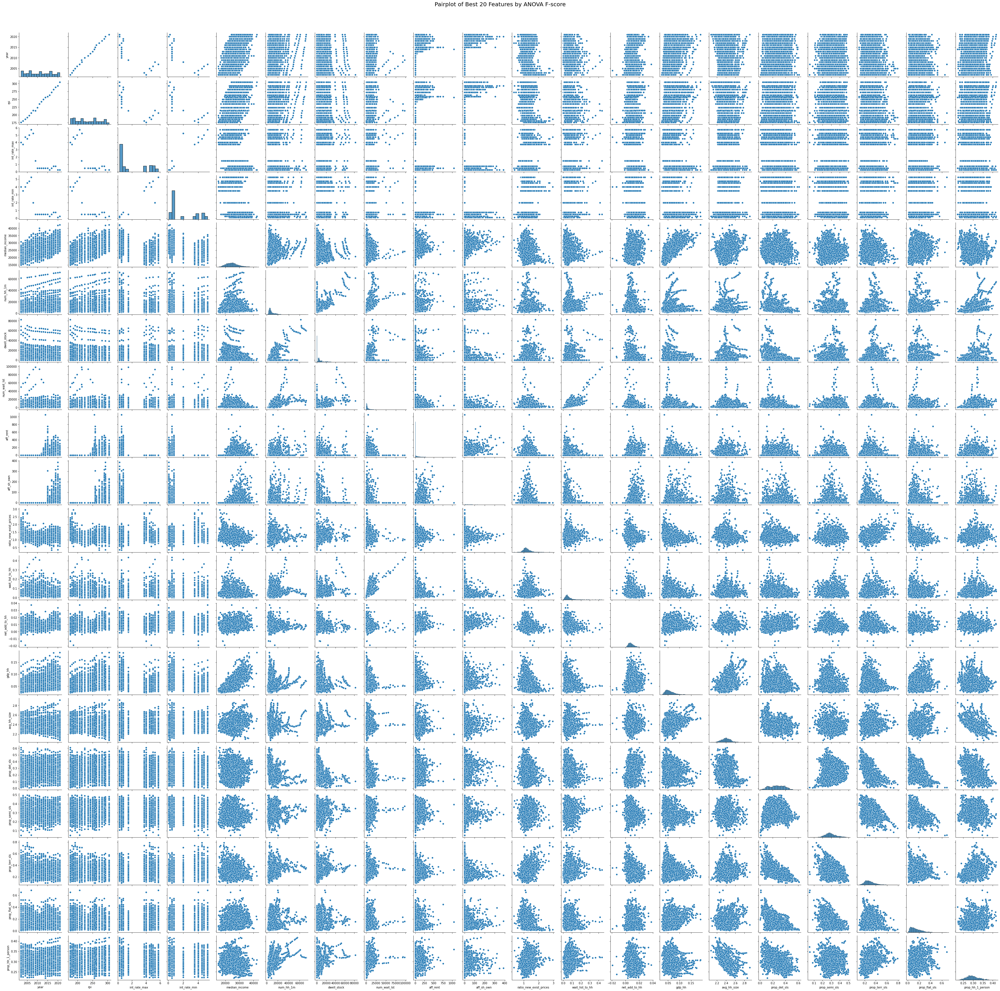

In [41]:
best_train2 = pd.DataFrame(la_train2, columns = best_out)

pp = sns.pairplot(best_train2)
plt.subplots_adjust(top = 0.95)
plt.suptitle('Pairplot of Best 20 Features by ANOVA F-score', fontsize = 20)
plt.show()

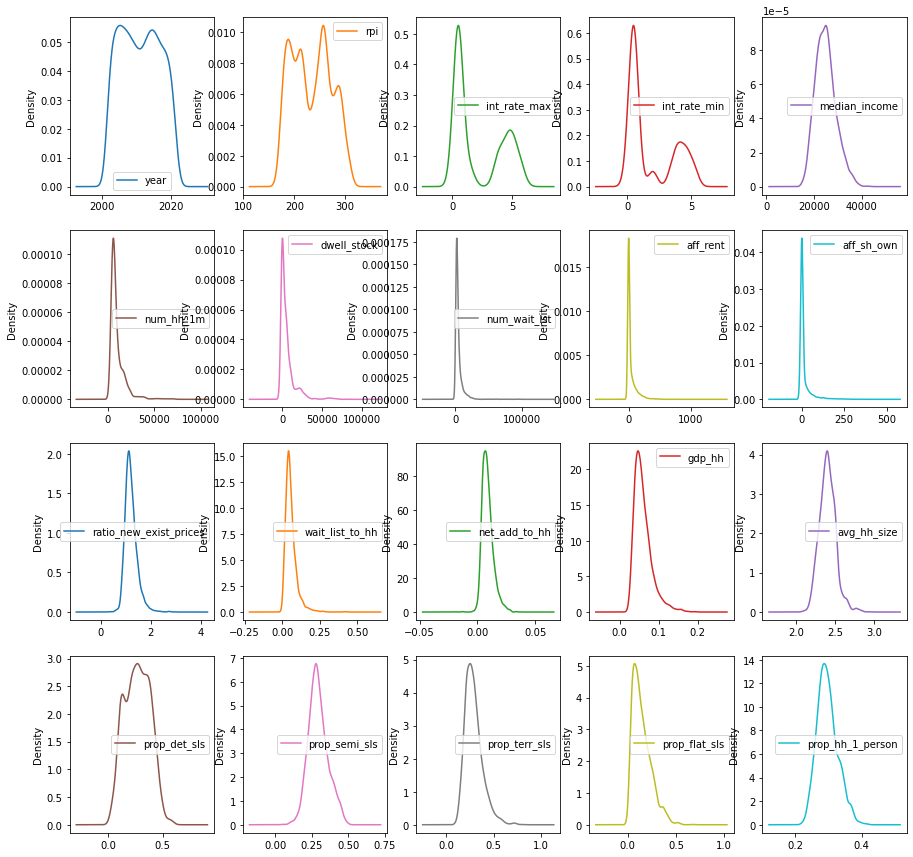

In [42]:
#Check denisty plots for skew of data:
best_train2.plot(kind='density', subplots = True, sharex = False, layout = (4,5), figsize = (15,15))
plt.show()

In [43]:
# best using mutual information:
kbest_mi = SelectKBest(mutual_info_regression, k=20)
kbest_mi.fit((scaled_X),(y_train))
best_out_mi = X_train.columns[kbest_mi.get_support()]
best_out_mi

Index(['year', 'total_area', 'rpi', 'int_rate_max', 'int_rate_min',
       'median_income', 'population', 'num_hh_1dp', 'num_hh_>2dp',
       'num_hh_2dp', 'num_hh_oth', 'dwell_stock', 'pop_density', 'avail_land',
       'g_belt_percent', 'pop_density_avail', 'ratio_new_exist_prices',
       'gdp_hh', 'prop_semi_sls', 'prop_flat_sls'],
      dtype='object')

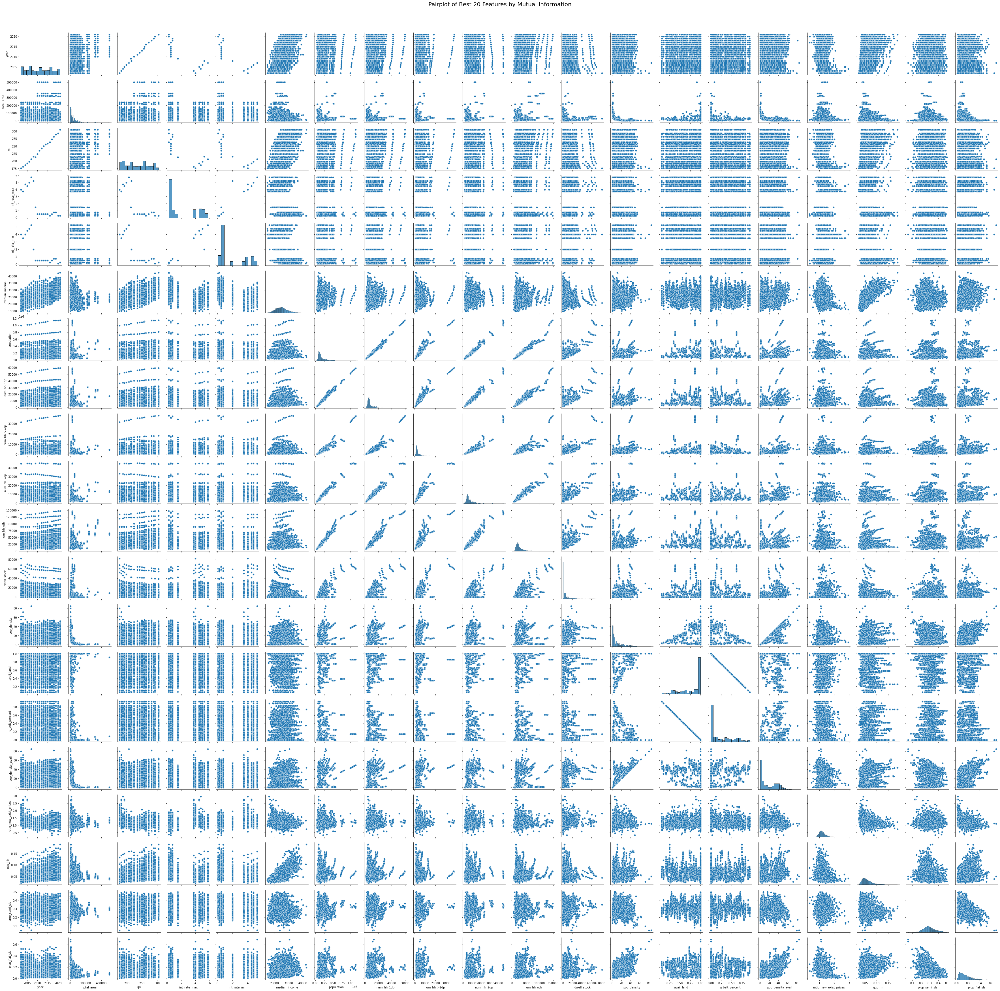

In [44]:
# there are some different features to those from the ANOVA f-score K best
best_train_mi = pd.DataFrame(la_train2, columns = best_out_mi)

pp = sns.pairplot(best_train_mi)
plt.subplots_adjust(top = 0.95)
plt.suptitle('Pairplot of Best 20 Features by Mutual Information', fontsize = 20)
plt.show()

In [45]:
# create list of 'best' features
best_all = list(set(best_out_mi.to_list() + best_out.to_list()))
best_all

['int_rate_min',
 'num_hh_2dp',
 'aff_rent',
 'net_add_to_hh',
 'pop_density',
 'g_belt_percent',
 'pop_density_avail',
 'median_income',
 'dwell_stock',
 'prop_semi_sls',
 'prop_hh_1_person',
 'population',
 'num_hh_oth',
 'prop_terr_sls',
 'wait_list_to_hh',
 'year',
 'ratio_new_exist_prices',
 'int_rate_max',
 'num_hh_1dp',
 'prop_flat_sls',
 'avg_hh_size',
 'gdp_hh',
 'num_hh_1m',
 'rpi',
 'num_hh_>2dp',
 'prop_det_sls',
 'num_wait_lst',
 'total_area',
 'avail_land',
 'aff_sh_own']

In [46]:
len(best_all)

30

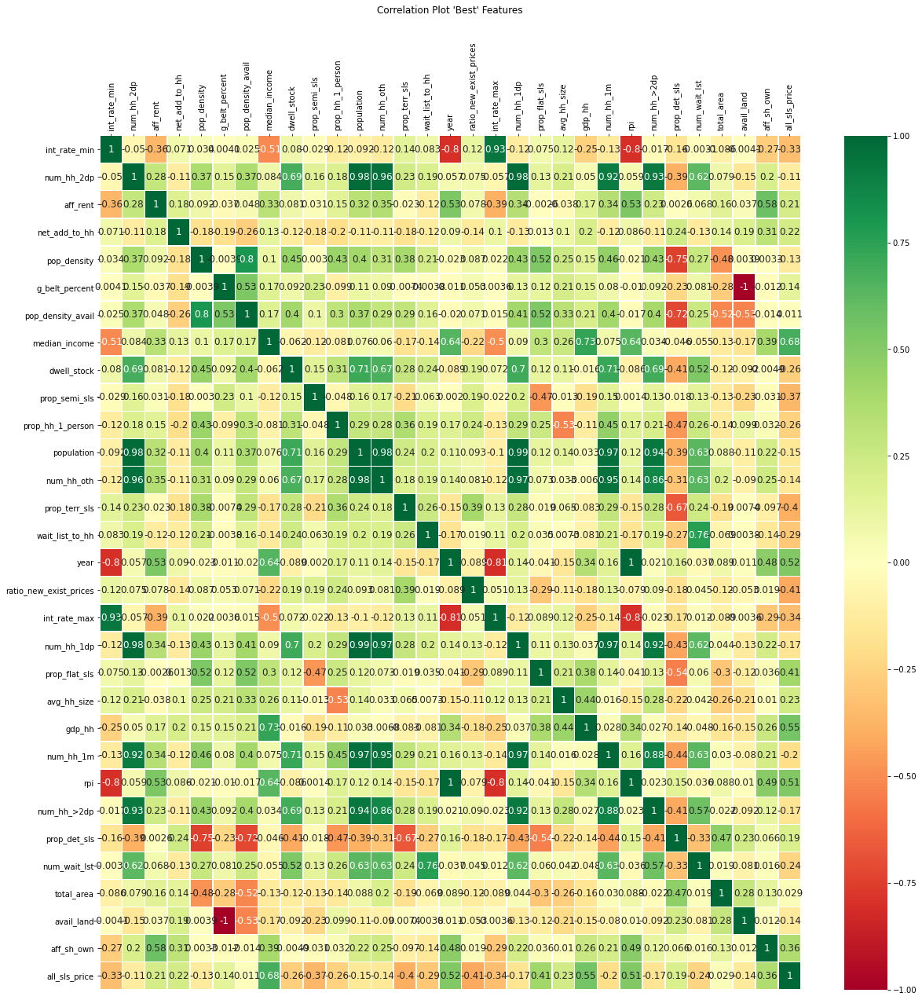

In [47]:
# look at correlations on this reduced/best set. Add target back on - all_sls_price

la_train_best = pd.DataFrame(la_train2, columns = best_all)
la_train_best['all_sls_price'] = y_train
#la_train_best.head()

col_labels = la_train_best.columns.to_list()

correl_best = la_train_best.corr(method='pearson')

fig, ax = plt.subplots(figsize=(20, 20))
sns.heatmap(correl_best,cmap = 'RdYlGn',vmax =1,vmin = -1,center = 0,annot=True, annot_kws={"size": 12}, linewidth=0.5)
ax.xaxis.tick_top() # x axis on top
ax.xaxis.set_label_position('top')
ax.set_xticklabels(col_labels,rotation = 90)
plt.title("Correlation Plot 'Best' Features\n\n")
plt.show()

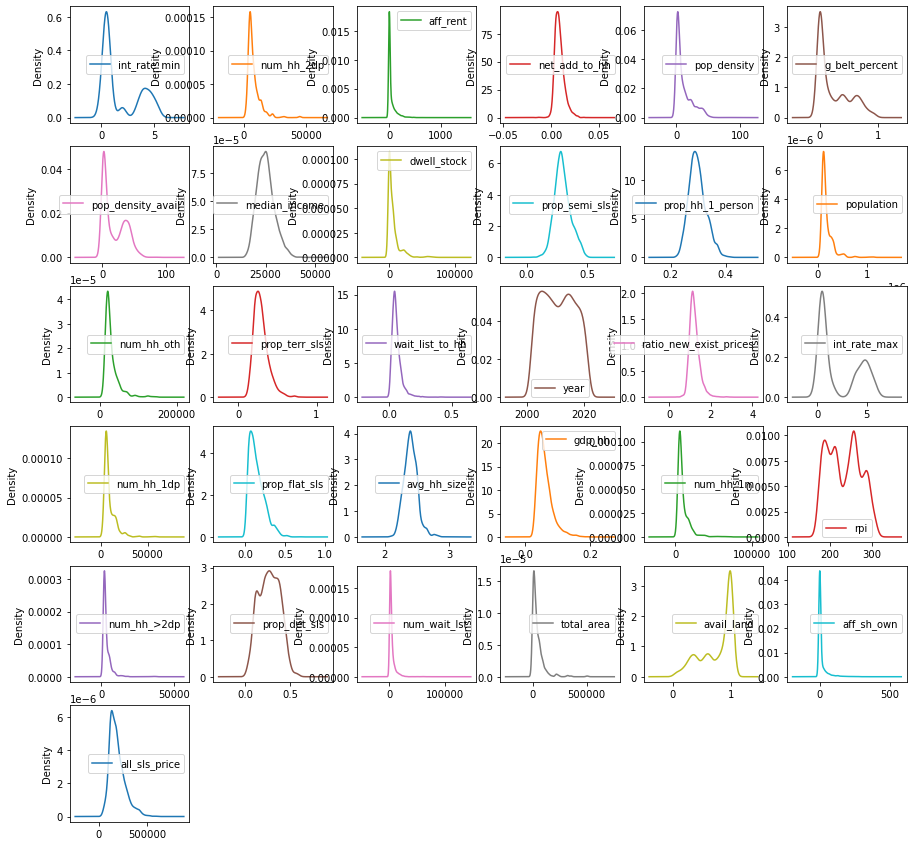

In [48]:
# density plots to see distribution/skew of best features:
la_train_best.plot(kind='density', subplots = True, sharex = False, layout = (6,6), figsize = (15,15))
plt.show()

In [49]:
#saving la_train2 - dataset including combined features, excl sls prices & volume by type
la_train2.to_csv('la_train_data.csv')

In [50]:
# Add the extra features to the test set:
y_test = pd.DataFrame(y_test)
la_test = X_test.merge(y_test, left_index = True, right_index = True)
la_test.head()

,la_code,la_name,year,g_belt_area,total_area,rpi,int_rate_max,int_rate_min,median_income,all_new_sls_price,det_new_sls_price,semi_new_sls_price,terr_new_sls_price,flat_new_sls_price,all_exist_sls_price,det_exist_sls_price,semi_exist_sls_price,terr_exist_sls_price,flat_exist_sls_price,det_sls_price,semi_sls_price,terr_sls_price,flat_sls_price,all_new_sls_num,det_new_sls_num,semi_new_sls_num,terr_new_sls_num,flat_new_sls_num,all_exist_sls_num,det_exist_sls_num,semi_exist_sls_num,terr_exist_sls_num,flat_exist_sls_num,all_sls_num,det_sls_num,semi_sls_num,terr_sls_num,flat_sls_num,population,num_hh_1dp,num_hh_>2dp,num_hh_2dp,num_hh_1f,num_hh_1m,num_hh_oth,num_hh_tot,gdp,dwell_stock,net_additions,num_wait_lst,aff_own,aff_rent,aff_int_rent,aff_lon_rent,aff_sh_own,aff_soc_rent,all_sls_price
3637,E08000027,Dudley,2018,1770,9800,281.6,0.75,0.75,26324,194950,259995,182500,193950,104996,160225,255000,161000,137500,96750,256000,162998,137998,97500,241,97,84,12,48,4064,874,1766,1054,370,4305,971,1850,1066,418,320626,17658.1822,6380.9534,14241.5811,20286.3703,18734.7316,56239.2814,133541.1000,6186,21943.0,712,2143.0,2.0,138.0,2.0,0.0,7.0,43.0,163500
490,E07000118,Chorley,2004,14560,20280,186.7,4.75,4.00,18768,140000,179000,125000,131053,101950,110000,188000,112500,80000,66475,185750,115000,83000,97500,536,247,73,93,123,2351,618,777,890,66,2887,865,850,983,189,102778,5727.9097,1883.2520,5102.0284,6240.7494,5380.5750,17928.4423,42262.9566,1585,3087.0,605,1643.0,8.0,0.0,0.0,0.0,0.0,6.0,118000
456,E07000200,Babergh,2004,0,59510,186.7,4.75,4.00,19584,185000,230000,154950,155000,115975,160000,225500,144000,121000,82000,226750,144000,122000,84000,71,37,15,9,10,1856,759,524,481,92,1927,796,539,490,102,85622,3872.8522,1639.4152,4140.4136,5832.6355,4075.0309,16022.1083,35582.4557,1423,3686.0,252,1527.0,6.0,0.0,0.0,0.0,0.0,85.0,160000
3659,E07000089,Hart,2018,0,21530,281.6,0.75,0.75,32367,400000,600000,440000,399000,255000,395000,570000,373000,318500,222000,575000,387750,324000,235000,297,73,68,47,109,1358,539,318,310,191,1655,612,386,357,300,96293,4899.0094,1656.3544,5309.0853,5174.5266,3539.4353,17138.0202,37716.4311,3330,0.0,551,1367.0,22.0,86.0,0.0,0.0,91.0,0.0,397500
1655,E08000002,Bury,2009,5920,9950,213.7,1.50,0.50,24418,117995,225000,182498,165789,98500,125000,206000,137500,98000,82000,210000,138000,99950,89995,94,7,6,13,68,1312,236,485,512,79,1406,243,491,525,147,183885,10512.4608,4034.3594,8694.4609,12593.6095,10936.2356,29623.8375,76394.9637,3099,8411.0,303,3181.0,21.0,0.0,0.0,0.0,0.0,25.0,125000


In [51]:
# Add the extra features to the test set:
#Population density
la_test['pop_density'] = la_test.population/la_test.total_area

#Available land - assumption that green belt isn't readily avaiable land
la_test['avail_land'] = (la_test.total_area-la_test.g_belt_area)/la_test.total_area

#Percentage green belt - very similar to avaialble land. check if one is better.
la_test['g_belt_percent'] = la_test.g_belt_area/la_test.total_area

#Population denisty on avaiable land - what is the density on the land that is not green belt
la_test['pop_density_avail'] = la_test.population/(la_test.total_area-la_test.g_belt_area)

#Ratio of new to existing prices
#this would be easier to forecast if didn't have new/existing prices yet but did have historic info
la_test['ratio_new_exist_prices'] = la_test.all_new_sls_price/la_test.all_exist_sls_price

#Ratio of new to existing sales volume
la_test['ratio_new_existing_num'] = la_test.all_new_sls_num/la_test.all_exist_sls_num

#Number on housing waiting list to total number of total households
la_test['wait_list_to_hh'] = la_test.num_wait_lst/la_test.num_hh_tot

#Number of net additions to the number of households
la_test['net_add_to_hh'] = la_test.net_additions/la_test.num_hh_tot

#GDP to household - hh and population strongly correlated.
# HH a concentration of the population
la_test['gdp_hh'] = la_test.gdp/la_test.num_hh_tot

#Avg hh size - larger hh, more people, different demand for housing size.
la_test['avg_hh_size'] = la_test.population/la_test.num_hh_tot


# proportion of each type of property sold
la_test['prop_det_sls'] = la_test.det_sls_num/la_test.all_sls_num
la_test['prop_semi_sls'] = la_test.semi_sls_num/la_test.all_sls_num
la_test['prop_terr_sls'] = la_test.terr_sls_num/la_test.all_sls_num
la_test['prop_flat_sls'] = la_test.flat_sls_num/la_test.all_sls_num

#proportion of one person households
la_test['prop_hh_1_person'] = (la_test.num_hh_1f+la_test.num_hh_1m)/la_test.num_hh_tot

#proportion of households with dependents
la_test['prop_hh_dp'] = (la_test['num_hh_1dp'] + la_test['num_hh_2dp'] + la_test['num_hh_>2dp'])/la_test['num_hh_tot']



In [52]:
la_test.insert(len(la_test.columns)-1,'all_sls_price',la_test.pop('all_sls_price'))
#Possible to have divided by zero in some instances. So dropna just in case
la_test.dropna(inplace =True)

# drop unwanted columns
# careful not to run the drop command again, will drop row indexes again.
la_test  = la_test.drop(la_test.iloc[:, 9:38], axis =1)
la_test.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 859 entries, 3637 to 469
Data columns (total 44 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   la_code                 859 non-null    object 
 1   la_name                 859 non-null    object 
 2   year                    859 non-null    int64  
 3   g_belt_area             859 non-null    int64  
 4   total_area              859 non-null    int64  
 5   rpi                     859 non-null    float64
 6   int_rate_max            859 non-null    float64
 7   int_rate_min            859 non-null    float64
 8   median_income           859 non-null    int64  
 9   population              859 non-null    int64  
 10  num_hh_1dp              859 non-null    float64
 11  num_hh_>2dp             859 non-null    float64
 12  num_hh_2dp              859 non-null    float64
 13  num_hh_1f               859 non-null    float64
 14  num_hh_1m               859 non-null   

In [53]:
la_test.to_csv('la_test_data.csv')

Now have train and test files, la_train and la_test.